# Computer Vision Project
#### Introduction to Machine learning course | Instructor: Dr. Fatemeh Mirsalehi

<font color='cyan'> Responsible TA: Amirhossein Razlighi </font>

In [9]:
%pip install torch torchvision numpy matplotlib Pillow

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (99 kB)
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21

In [10]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt

In [11]:
#image paths here to setup easily for different running envs
im_path_sharif_1 = '/content/Sharif_1.JPG'
im_path_sharif_2 = '/content/Sharif_2.jpg'
im_path_Car = '/content/Car.jpeg'
im_path_Content = '/content/Content.jpeg'
im_path_Style = '/content/style.jpeg'

## Section 1: Implementing a CNN from scratch! (30 points)

### 1.1 - Forward and Backward (20/30 pts)

__CNN__ s are powerfull tools to work with in the scope of _Computer Vision_. You have seen MLPs before and know how to do forward and backward pass on them. In this part, we want to create a convolutional layer (a simple one, of course!) just to understand well that how a Convolutional Layer works, behind the scenes. Then, we can simply use PyTorch's `Conv2D` layer for the rest of this project, because we understood that how Convolutions work, behind the scene!

__FORWARD PASS__:

In forward pass, you should apply the convolution operation on the input image. The convolution operation is as follows:

$$
\text{output}[i, j] = \sum_{k=0}^{K-1} \sum_{l=0}^{L-1} \text{input}[i+k, j+l] \times \text{kernel}[k, l]
$$

You can see a sample convolution operation (with a $3 \times 3$ kernel) in the following image:
<div style="text-align:center;">
  <img src="./Images/Conv.gif" />
</div>

Please note that, these are samples for you to understand the operation better. For _forward pass_ that you should implement, please notice that you should convolve the kernel along all $C$ channels of the input image. So, the output shape should be $(N, H_{out}, W_{out})$. These values are calculated as follows:

$$
H_{out} = \frac{H_{in} + 2 \times \text{padding}}{\text{stride} - HH} + 1
$$
$$
W_{out} = \frac{W_{in} + 2 \times \text{padding}}{\text{stride} - WW} + 1
$$


where $HH$ and $WW$ are the height and width of the kernel, respectively. __stride__ is the step size of the kernel, and __padding__ is the number of zeros that should be padded to the input image. Please also note that $b$ stands for bias, which is a scalar value that should be added to the output of the convolution operation. (for each kernel)

You can see a more detailed example, below:

<div style="text-align:center;">
  <img src="./Images/conv3.gif" />
</div>

__Backward Pass__:

In backward pass, you should calculate gradient of output with respect to the input image and the kernel. These gradients will be used in _optimization_ to update kernel weights. (You saw something similar, in using MLPs with gradient descent algorithm!). So, we need $d_x$, $d_w$ and $d_b$ in the backward pass. These are calculated as follows:

$$
dx_{padded} [n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] += w[f] \times dout[n, f, i, j]
$$

$$
dw_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} x_{padded}[n, :, i * stride: i * stride + HH, j * stride: j * stride + WW] \times dout[n, f, i, j]  
$$

$$
db_{f} = \sum_{n=0}^{N - 1} \sum_{i=0}^{H_{out} - 1} \sum_{j=0}^{W_{out} - 1} dout[n, f, i, j]
$$

For better understanding of the backward pass, you can see the following image:

<div style="text-align:center;">
  <img src="./Images/backprop_cs231n.png" />
</div>


In [12]:
import numpy as np


class MyConv:
    def __init__(self, stride, padding):
        self.stride = stride
        self.padding = padding

    def forward(self, x, w, b):
        out = None

        ####### TO DO : Implement Forward pass of Conv2D #######
        ########################################################

        N, C, H, W = x.shape
        F, C, HH, WW = w.shape
        pad = self.padding
        stride = self.stride
        H_out = 1 + (H + 2 * pad - HH) // stride
        W_out = 1 + (W + 2 * pad - WW) // stride

        x_pad = np.pad(x, ((0, 0), (0, 0), (pad, pad), (pad, pad)), mode='constant')
        out = np.zeros((N, F, H_out, W_out))


        for n in range(N):
            for f in range(F):
                for i in range(H_out):
                    for j in range(W_out):
                        out[n, f, i, j] =  np.sum(
                            x_pad[n, :, i * stride:i * stride + HH, j * stride:j * stride + WW] * w[f]
                        ) + b[f]

        ####### TO DO : End #######
        #############################

        cache = (x, w, b, x_pad)
        self.cache = cache
        return out

    def backward(self, dout):
        dx, dw, db = None, None, None

        x, w, b, x_padded = self.cache

        ####### TO DO : Implement backward pass #######
        ###############################################

        N, C, H, W = x.shape
        F, C, HH, WW =  w.shape
        N, F, H_OUT, W_OUT = dout.shape

        pad = self.padding
        stride = self.stride

        dw = np.zeros_like(w)
        dx = np.zeros_like(x)
        db = np.zeros_like(b)

        dx_padded = np.zeros_like(x_padded)

        for n in range(N):
            for f in range(F):
                for i in range(H_OUT):
                    for j in range(W_OUT):
                        dw[f] += x_padded[n, :, i * stride:i * stride + HH, j * stride:j * stride + WW] * dout[n, f, i, j]
                        dx_padded[
                            n,
                            :,
                            i * self.stride : i * self.stride + HH,
                            j * self.stride : j * self.stride + WW,
                        ] += w[f] * dout[n, f, i, j]
                        db[f] += dout[n, f, i, j]

        dx = dx_padded[:, :, pad:pad+H, pad:pad+W]
        #db = ...

        ####### TO DO : End #######
        #############################

        self.dx = dx
        self.dw = dw
        self.db = db
        return dx, dw, db

In [13]:
def rel_error(x, y):
  return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

In [14]:
# A simple test for forward pass (DO NOT CHANGE)

x_shape = (2, 3, 4, 4)
w_shape = (3, 3, 4, 4)
x = np.linspace(-0.1, 0.5, num=np.prod(x_shape)).reshape(x_shape)
w = np.linspace(-0.2, 0.3, num=np.prod(w_shape)).reshape(w_shape)
b = np.linspace(-0.1, 0.2, num=3)

out = MyConv(stride=2, padding=1).forward(x, w, b)
correct_out = np.array([[[[[-0.08759809, -0.10987781],
                           [-0.18387192, -0.2109216 ]],
                          [[ 0.21027089,  0.21661097],
                           [ 0.22847626,  0.23004637]],
                          [[ 0.50813986,  0.54309974],
                           [ 0.64082444,  0.67101435]]],
                         [[[-0.98053589, -1.03143541],
                           [-1.19128892, -1.24695841]],
                          [[ 0.69108355,  0.66880383],
                           [ 0.59480972,  0.56776003]],
                          [[ 2.36270298,  2.36904306],
                           [ 2.38090835,  2.38247847]]]]])

# The outputted difference which is printed, should be around 1e-8
print ('Testing conv_forward_naive')
print ('difference: ', rel_error(out, correct_out))

Testing conv_forward_naive
difference:  2.2121476417505994e-08


In [15]:
def eval_numerical_gradient_array(f, x, df, h=1e-5):
  grad = np.zeros_like(x)
  it = np.nditer(x, flags=['multi_index'], op_flags=['readwrite'])
  while not it.finished:
    ix = it.multi_index

    oldval = x[ix]
    x[ix] = oldval + h
    pos = f(x).copy()
    x[ix] = oldval - h
    neg = f(x).copy()
    x[ix] = oldval

    grad[ix] = np.sum((pos - neg) * df) / (2 * h)
    it.iternext()
  return grad

In [16]:
# A simple test for backward pass (DO NOT CHANGE)

x = np.random.randn(4, 3, 5, 5)
w = np.random.randn(2, 3, 3, 3)
b = np.random.randn(
    2,
)
dout = np.random.randn(4, 2, 5, 5)
conv = MyConv(stride=1, padding=1)

dx_num = eval_numerical_gradient_array(
    lambda x: conv.forward(x, w, b), x, dout
)
dw_num = eval_numerical_gradient_array(
    lambda w: conv.forward(x, w, b), w, dout
)
db_num = eval_numerical_gradient_array(
    lambda b: conv.forward(x, w, b), b, dout
)

out = conv.forward(x, w, b)
dx, dw, db = conv.backward(dout)

# Your printed errors should be around 1e-9
print("Testing conv_backward_naive function")
print("dx error: ", rel_error(dx, dx_num))
print("dw error: ", rel_error(dw, dw_num))
print("db error: ", rel_error(db, db_num))

Testing conv_backward_naive function
dx error:  4.7088537198925695e-09
dw error:  4.872841386806763e-10
db error:  3.07137514428513e-12


### 1.2 - Visualizing Convolution results (10/30 pts)

In this part, we try to visualize the results of the convolution operation. We will 2 sample photos (in `Images/Sample`) and then we will use our `MyConv` class to apply some cool convolutions (and see their result on an image).

In [17]:
from PIL import Image

first_img, second_img = Image.open(im_path_sharif_1), Image.open(
    im_path_sharif_2
)
first_img = first_img.resize((256, 256))
second_img = second_img.resize((256, 256))

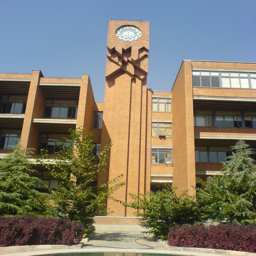

In [18]:
first_img

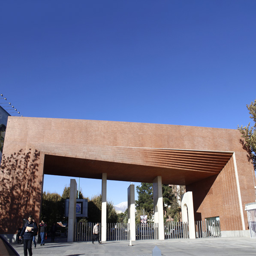

In [19]:
second_img

Convolutions have some interesting usages in image processing. For example, you can extract edges from an image by applying a convolution with a kernel that detects edges. Or you can convolve a specific kernel with your image to make it grayscale or blurred! Look at the definitions below:

__Edge Detection Kernel__:

_Sobel_ is one of the most famous edge detection kernels. It has two kernels, one for detecting vertical edges and the other for horizontal edges. You can see the kernels below:
$$
\text{Sobel}_x = \begin{bmatrix}
-1 & 0 & 1 \\
-2 & 0 & 2 \\
-1 & 0 & 1
\end{bmatrix}
$$

$$
\text{Sobel}_y = \begin{bmatrix}
-1 & -2 & -1 \\
0 & 0 & 0 \\
1 & 2 & 1
\end{bmatrix}
$$


__Grayscale Kernel__:

You can simply convolve the image with the following kernel to make it grayscale:

$$
\text{Grayscale\_across\_R} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.3 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_G} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.6 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

$$
\text{Grayscale\_across\_B} = \begin{bmatrix}
0 & 0 & 0 \\
0 & 0.1 & 0 \\
0 & 0 & 0
\end{bmatrix}
$$

(Convolve each kernel with its corresponding channel)

__Blurring Kernel__:

One of the famous kernels to blur an image is _Gaussian Blur_. You can see the kernel below:

$$
\text{Gaussian\_Blur} = \frac{1}{16} \times \begin{bmatrix}
1 & 2 & 1 \\
2 & 4 & 2 \\
1 & 2 & 1
\end{bmatrix}
$$


In [20]:
img_size = 256

x = np.zeros((2, 3, img_size, img_size))
x[0] = np.array(first_img).transpose(2, 0, 1)
x[1] = np.array(second_img).transpose(2, 0, 1)

# a convolution weight, holding 4 filters 3x3
w = np.zeros((4, 3, 3, 3))

b = np.array([0, 128, 128, 0])

# Sobel X kernel
w[0, 0, :, :] = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]])
w[0, 1, :, :] = w[0, 0, :, :]
w[0, 2, :, :] = w[0, 0, :, :]

# Sobel Y kernel
w[1, 0, :, :] = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
w[1, 1, :, :] = w[1, 0, :, :]
w[1, 2, :, :] = w[1, 0, :, :]

# Grayscale kernel
w[2, 0, :, :] = np.array([[0, 0, 0], [0, 0.3, 0], [0, 0, 0]])
w[2, 1, :, :] = np.array([[0, 0, 0], [0, 0.6, 0], [0, 0, 0]])
w[2, 2, :, :] = np.array([[0, 0, 0], [0, 0.1, 0], [0, 0, 0]])

# Gaussian blur kernel
gaussian_kernel = (1 / 16) * np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])
w[3, 0, :, :] = gaussian_kernel
w[3, 1, :, :] = gaussian_kernel
w[3, 2, :, :] = gaussian_kernel


conv = MyConv(stride=1, padding=1)
out = conv.forward(x, w, b)

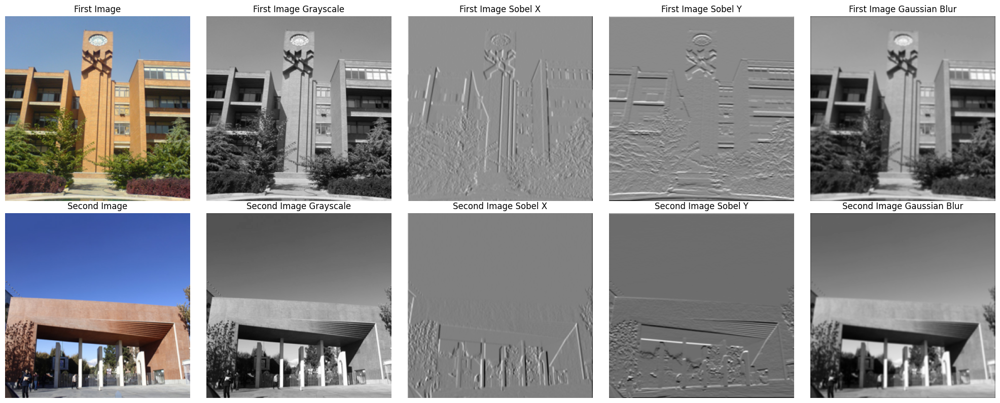

In [22]:
import matplotlib.pyplot as plt

#TODO: Plot the original image, grayscale, sobel x, sobel y, and gaussian blur of each image
fig, axes = plt.subplots(2, 5, figsize=(20, 8))
axes = axes.flatten()

# Original images
axes[0].imshow(first_img)
axes[0].set_title("First Image")
axes[0].axis('off')

axes[5].imshow(second_img)
axes[5].set_title("Second Image")
axes[5].axis('off')

# Grayscale
axes[1].imshow(out[0, 2, :, :], cmap='gray')
axes[1].set_title("First Image Grayscale")
axes[1].axis('off')

axes[6].imshow(out[1, 2, :, :], cmap='gray')
axes[6].set_title("Second Image Grayscale")
axes[6].axis('off')

# Sobel X
axes[2].imshow(out[0, 0, :, :], cmap='gray')
axes[2].set_title("First Image Sobel X")
axes[2].axis('off')

axes[7].imshow(out[1, 0, :, :], cmap='gray')
axes[7].set_title("Second Image Sobel X")
axes[7].axis('off')

# Sobel Y
axes[3].imshow(out[0, 1, :, :], cmap='gray')
axes[3].set_title("First Image Sobel Y")
axes[3].axis('off')

axes[8].imshow(out[1, 1, :, :], cmap='gray')
axes[8].set_title("Second Image Sobel Y")
axes[8].axis('off')

# Gaussian Blur
axes[4].imshow(out[0, 3, :, :], cmap='gray')
axes[4].set_title("First Image Gaussian Blur")
axes[4].axis('off')

axes[9].imshow(out[1, 3, :, :], cmap='gray')
axes[9].set_title("Second Image Gaussian Blur")
axes[9].axis('off')

plt.tight_layout()
plt.show()

Now that we understood how Convolution works, we proceed further to use it in our models to perform a desired and specific task! We can use PyTorch's `Conv2D` layer from now on, because we understood how Convolutions work, behind the scene!

## Section 2: Neural Style Transfer (90 points)

In this part, we are going to implement a famous technique in the field of _Computer Vision_ called __Neural Style Transfer__. This technique is used to apply the style of a specific image to another image. For example, you can apply the style of a famous painting to your photo! Let's get started!

### 2.1 - Importing Libraries

In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
from torchvision.models import vgg19, VGG19_Weights

import copy

In [24]:
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available() else "cpu"
)
torch.set_default_device(device)
device

device(type='cuda')

### 2.2 - Loading Images and doing some Preprocessing (5/90 pts)

In this part, you should load the content and style images and preprocess them. Preprocessing includes resizing the images to a specific size, normalizing them, and converting them to PyTorch tensors. You can use `torchvision.transforms` to do these tasks.

In [25]:
img_size = 512 if not device == "cpu" else 256

#TODO: Implement some transformations for the images
imloading_transform = transforms.Compose([
    transforms.Resize((img_size,img_size)),
    transforms.ToTensor(),
    #transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [26]:
def load_image(image_path):
    image = Image.open(image_path)
    image = imloading_transform(image).unsqueeze(0)
    return image.to(device, torch.float)

In [27]:
style_image_path = im_path_Style
content_image_path = im_path_Content

style_image = load_image(style_image_path) # It's in Images/Neural_Transfer/Style.jpeg
content_image = load_image(content_image_path) # It's in Images/Neural_Transfer/Content.jpeg

assert style_image.size() == content_image.size()

style_image.size(), content_image.size()

(torch.Size([1, 3, 512, 512]), torch.Size([1, 3, 512, 512]))

Here, you should implement a helper function to show you images (which are now in form of pytorch tensors) in the notebook. You can use `torchvision.transforms.ToPILImage` to convert a tensor to a PIL image.

In [28]:
#TODO
plt.ion()

def imshow(tensor, title=None):
    unloader = transforms.Compose([
        #transforms.Normalize(mean=[-2.12, -2.04, -1.80], std=[4.37, 4.46, 4.44]),
        transforms.ToPILImage()
    ])
    image = tensor.cpu().clone()
    image = image.squeeze(0)
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)

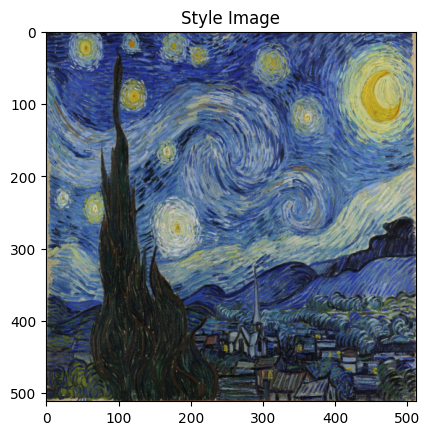

In [29]:
plt.figure()
imshow(style_image, "Style Image")

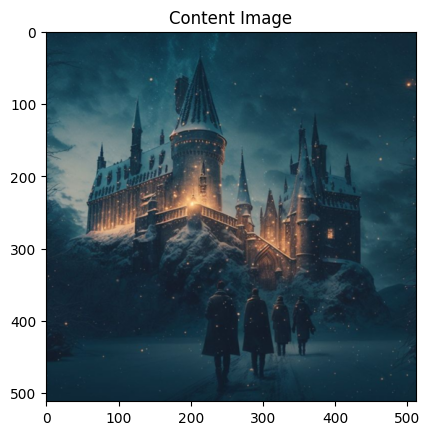

In [30]:
plt.figure()
imshow(content_image, "Content Image")

### 2.2 - VGG19 Model (15/90 pts)

One of the important parts of Neural Style Transfer is to use a pre-trained model to extract features from the content and style images. Here, we are going to use a pre-trained VGG19 model to extract features from the images. You can use `torchvision.models.vgg19` to load the model. You should also freeze the weights of the model to prevent them from updating during the optimization process.

<div style="text-align:center;">
  <img src="./Images/VGG-19.png" />
</div>

But what is VGG model? Let's see with a simple experiment:

In [31]:
import certifi
import os

os.environ['SSL_CERT_FILE'] = certifi.where()

Here, please load `VGG19` model from `torchvision.models` and see the architecture of the model. You may need models `features` and `classifier` part stored seperately as we will discuss these both parts.

In [32]:
#TODO
vgg_model = vgg19(weights=VGG19_Weights.DEFAULT)#.to(device).eval()
vgg_model_features = vgg_model.features.eval()
vgg_model_classifier = vgg_model.classifier.eval()

In [33]:
import torchsummary

#TODO: Print the summary of the vgg_model
torchsummary.summary(vgg_model, (3, img_size, img_size))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 512, 512]           1,792
              ReLU-2         [-1, 64, 512, 512]               0
            Conv2d-3         [-1, 64, 512, 512]          36,928
              ReLU-4         [-1, 64, 512, 512]               0
         MaxPool2d-5         [-1, 64, 256, 256]               0
            Conv2d-6        [-1, 128, 256, 256]          73,856
              ReLU-7        [-1, 128, 256, 256]               0
            Conv2d-8        [-1, 128, 256, 256]         147,584
              ReLU-9        [-1, 128, 256, 256]               0
        MaxPool2d-10        [-1, 128, 128, 128]               0
           Conv2d-11        [-1, 256, 128, 128]         295,168
             ReLU-12        [-1, 256, 128, 128]               0
           Conv2d-13        [-1, 256, 128, 128]         590,080
             ReLU-14        [-1, 256, 1

Please briefly explain what is a VGG model used for and what does each `features` and `classifier` part, represent?

**Your Answer:**

### VGG Model Overview

The VGG model is a type of Convolutional Neural Network (CNN) used primarily for image recognition and classification tasks. It is known for its simple and deep architecture, which significantly improves image recognition accuracy.

### Purpose

*   **Image Classification**: Identifying and labeling objects in images (e.g., cats, dogs, cars).
*   **Object Detection**: Detecting and locating objects within images.
*   **Feature Extraction**: Extracting high-level features from images for use in other tasks like transfer learning.

### Structure

The VGG model consists of two main parts: the **features part** and the **classifier part**.

#### Features Part

1.  **Convolutional Layers (Conv2d)**:
    
    *   Apply filters to input images to capture various patterns.
    *   Early layers capture simple features like edges, while deeper layers capture complex patterns.
2.  **ReLU Layers**:
    
    *   Apply the Rectified Linear Unit activation function to introduce non-linearity.
    *   Helps the network learn more complex patterns.
3.  **Pooling Layers (MaxPool2d)**:
    
    *   Reduce the spatial dimensions of the feature maps.
    *   Decrease computational complexity and help prevent overfitting.
    *   Max pooling selects the maximum value from each region, retaining important features.

#### Classifier Part

1.  **Flattening**:
    
    *   Converts the 3D feature maps into a 1D vector.
    *   This vector is then fed into the fully connected layers.
2.  **Fully Connected Layers (Linear)**:
    
    *   Perform linear transformations on the flattened vector.
    *   Combine the extracted features to make final predictions.
3.  **ReLU Layers**:
    
    *   Introduce non-linearity in the fully connected layers.
4.  **Dropout Layers**:
    
    *   Regularization technique to prevent overfitting.
    *   Randomly sets a fraction of the input units to zero during training.
5.  **Output Layer**:
    
    *   Produces a vector corresponding to the number of classes.
    *   Typically followed by a softmax function to output probabilities for each class.

### Summary

*   **Features Part**: Extracts spatial hierarchies and patterns from images using convolutional layers, ReLU activations, and pooling layers.
*   **Classifier Part**: Uses fully connected layers, ReLU activations, and dropout to classify the extracted features into different categories.

The VGG model's straightforward yet deep architecture has proven effective in achieving high accuracy in image recognition tasks.

Now, we are going to give a sample image `Images/Neural_Transfer/Car.jpeg` to the model, see the output for classification and also visualize the feature maps (outputs of each convolutional layer) to see what's going on!

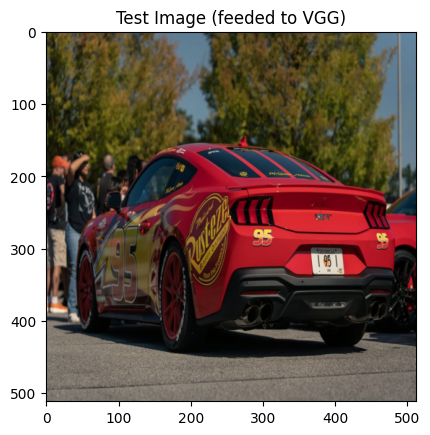

In [34]:
vgg_test_image = Image.open(im_path_Car)

#TODO: Plot the image which we are feeding to the model

#TODO: required transformations for the input to the vgg model
preprocess_vgg = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) #interestingly without this result will be race car instead of sports car
])
input_image = preprocess_vgg(vgg_test_image).unsqueeze(0).to(device)
unloader = transforms.Compose([
    transforms.Normalize(mean=[-2.12, -2.04, -1.80], std=[4.37, 4.46, 4.44]),
    transforms.ToPILImage()
])
image = input_image.cpu().clone()
image = image.squeeze(0)
image = unloader(image)
plt.imshow(image)
plt.title("Test Image (feeded to VGG)")
plt.pause(0.001)
#TODO: Predict the output of the vgg model for the test image (final classifier output and also each feature map output (in Conv2D layers))
output = vgg_model(input_image)
_, predicted = torch.max(output, 1)

As you can see, the output of the classifier is an integer. This integer is actually the **class number** in _Image Net_ dataset. Let's get the name of the class:

In [35]:
import requests

class_idx = requests.get(
    "https://raw.githubusercontent.com/anishathalye/imagenet-simple-labels/master/imagenet-simple-labels.json"
).json()

# Get the class name
class_name = class_idx[predicted.item()]

print(f"Predicted class: {class_name}")

Predicted class: sports car


Now that we understood the architecture of VGG, and also the output of its classifier, it's time to extract features from the images! And see what's going on in the feature maps!

Feature maps of convolutional layer 0


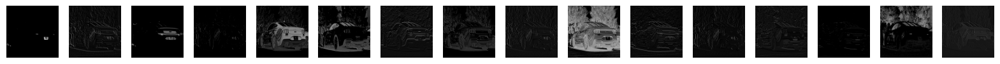

Feature maps of convolutional layer 2


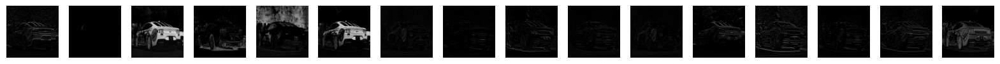

Feature maps of convolutional layer 5


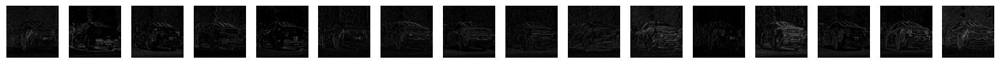

Feature maps of convolutional layer 7


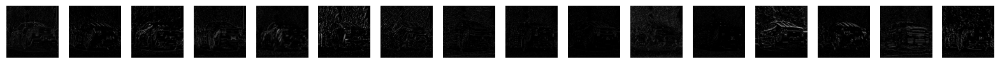

Feature maps of convolutional layer 10


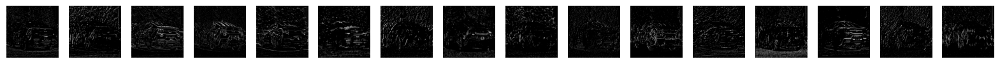

Feature maps of convolutional layer 12


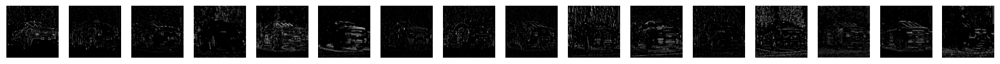

Feature maps of convolutional layer 14


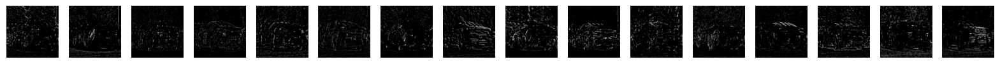

Feature maps of convolutional layer 16


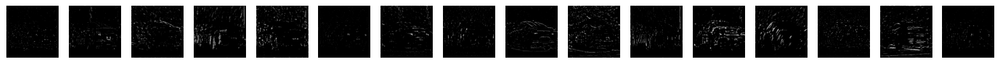

Feature maps of convolutional layer 19


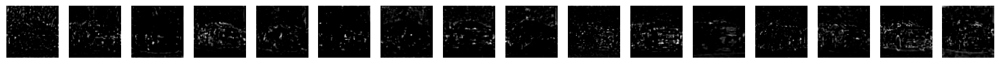

Feature maps of convolutional layer 21


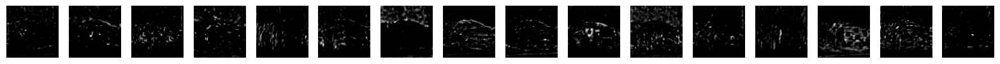

Feature maps of convolutional layer 23


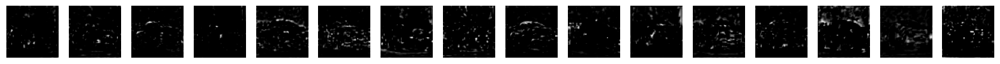

Feature maps of convolutional layer 25


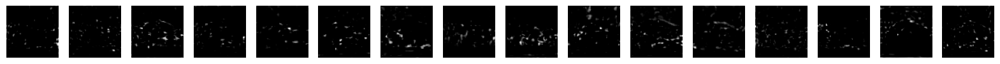

Feature maps of convolutional layer 28


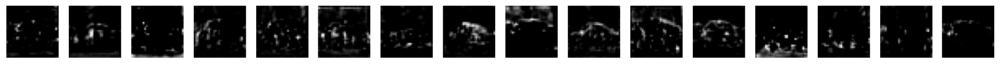

Feature maps of convolutional layer 30


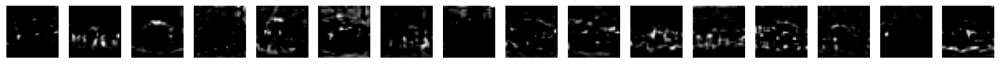

Feature maps of convolutional layer 32


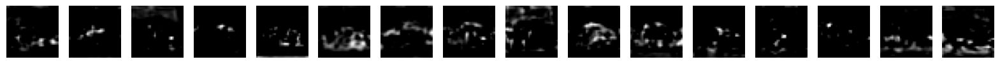

Feature maps of convolutional layer 34


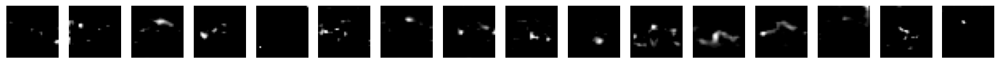

In [36]:
# Visualize the first 16 feature maps of each Conv2D layer (there are 16 Conv2D layers in VGG19)
#TODO
def visualize_feature_maps(model, image):
    activation = {}
    def get_activation(name):
        def hook(model, input, output):
            activation[name] = output.detach()
        return hook

    for name, layer in model._modules.items():
        if isinstance(layer, nn.Conv2d):
            layer.register_forward_hook(get_activation(name))

    model(image)

    for name, output in activation.items():
        print(f"Feature maps of convolutional layer {name}")
        fig, axes = plt.subplots(1, 16, figsize=(20, 20))
        for idx in range(16):
            ax = axes[idx]
            ax.imshow(output[0, idx].cpu(), cmap='gray')
            ax.axis('off')
        plt.show()

# Visualize feature maps
visualize_feature_maps(vgg_model_features, input_image)

It's fun too look under the hood, isn't it? As you can see, we can guess what are the learned features in each layer if the network (at least in the first layers). For example, in the first layer, the network learns to detect edges, and in the second layer, it learns to detect simple shapes. In the deeper layers, the network learns to detect more complex features.

### 2.3 - Content and Style Loss (15/90 pts)

In order to learn the correct image and keep the content of the original image while applying the style of the seconf image, we need 2 losses: 1. Content Loss and 2. Style Loss. Let's delve into each one!

**Content Loss** is responsible for keeping the content of the original image. It is calculated as the mean squared error between the feature maps of the original image and the generated image.

In [37]:
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        #TODO
        self.target = target.detach()  # Detach the target from the computation graph
        self.loss = F.mse_loss  # Mean Squared Error loss function



    def forward(self, input):
        #TODO
        self.loss_value = self.loss(input, self.target)
        return input

**Style Loss** is responsible for applying the style of the second image to the generated image. It is calculated as the mean squared error between the Gram matrices of the feature maps of the second image and the generated image.

In [38]:
def gram_calculator(input):
    """
    Calculate the normalized Gram Matrix of a given input
    """
    # TODO
    batch_size, num_channels, height, width = input.size()
    features = input.view(batch_size * num_channels, height * width)
    G = torch.mm(features, features.t())
    return G.div(batch_size * num_channels * height * width)


In [39]:
class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        # TODO
        self.target = gram_calculator(target_feature).detach()

    def forward(self, input):
        # TODO
        G = gram_calculator(input)
        self.loss_value = F.mse_loss(G, self.target)
        return input

Now, we use `features` part of the VGG model to extract features from the content and style images. Then, we calculate the content and style loss using the extracted features.

In [40]:
class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        return (img - self.mean) / self.std

In [41]:
cnn = vgg_model_features #TODO: Get the `features` part of the VGG19 model

In [42]:
cnn_normalization_mean = torch.tensor(
    [0.485, 0.456, 0.406]
)  # Normalization mean for the VGG19 model
cnn_normalization_std = torch.tensor(
    [0.229, 0.224, 0.225]
)  # Normalization std for the VGG19 model

# Normalize the images in order to feed it to the VGG19 model
normalization = Normalization(cnn_normalization_mean, cnn_normalization_std)#.to(device)


/usr/local/lib/python3.10/dist-packages/torch/utils/_device.py:78: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


Please note that after which layers you should calculate the content loss and after which ones, you should calculate the style loss. Use the layer names you saw earlier in the `torchsummary` output for VGG19 model.

In [43]:
content_layers_default = ['conv_4'] # TODO
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5'] # TODO

#TODO: any processes you want to add and/or helper functions

def get_style_model_and_losses(cnn,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):

    content_losses = []
    style_losses = []

    model = nn.Sequential(normalization)

    i = 0
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses

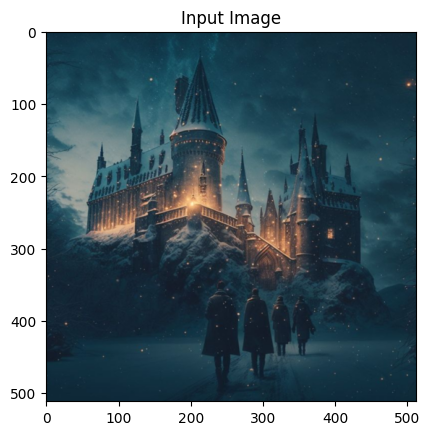

In [44]:
# Plot the input image to the model
# TODO
input_image = content_image.clone()
plt.figure()
imshow(input_image, "Input Image")

(15/90 pts) Now, we need to define our optimizer. We use `LBFGS` optimizer. Let's get familiar with this optimizer a little bit:

Let's use this optimizer to optimize a simple function $f(x) = x^2$. We want to find the minimum of this function using `LBFGS` optimizer. First, you should initialize a tensor $x$ with a random value. Then, you should define a closure function that calculates the value of the function and its gradient. Finally, you should use the `step` method of the optimizer to update the value of $x$.

And lastly, you should generate an animation using `matplotlib.animation` to show how the value of $x$ changes during optimization.

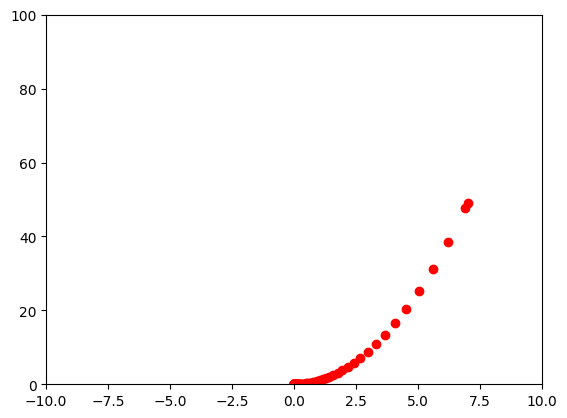

In [45]:
import matplotlib.animation as animation
from torch.optim import LBFGS
import IPython.display as display


# TODO: Define a simple quadratic function
def quadratic_function(x):
    return x**2

# Initialize a tensor with a single random value (e.g. 5.0/7.0/10.0/...)
x = torch.tensor([7.0], requires_grad=True)

optimizer = LBFGS([x], lr=0.1)

#TODO: Implement the optimization loop and animate the results
x_values = []
y_values = []

def closure():
    optimizer.zero_grad()
    loss = quadratic_function(x)
    loss.backward()
    x_values.append(x.item())
    y_values.append(loss.item())
    return loss

for i in range(20):
    optimizer.step(closure)

fig, ax = plt.subplots()
line, = ax.plot([], [], 'ro')
ax.set_xlim(-10, 10)
ax.set_ylim(0, 100)

def init():
    line.set_data([], [])
    return line,

def animate(i):
    line.set_data(x_values[:i], y_values[:i])
    return line,

# Create the animation
ani = animation.FuncAnimation(fig, animate, init_func=init, frames=len(x_values), interval=200, blit=True)

# Display the animation
display.HTML(ani.to_jshtml())


(35/90 pts) Now, let's use this optimizer to optimize our `input_image` to minimize the content and style loss. You should define a closure function that calculates the content and style loss and their gradients. Then, you should use the `step` method of the optimizer to update the value of the `input_image`. Please also **note** that you should use a weighted sum of the content and style loss to optimize the input image. (weight of each loss is a hyperparameter)

Optimizing...
Step 0/300


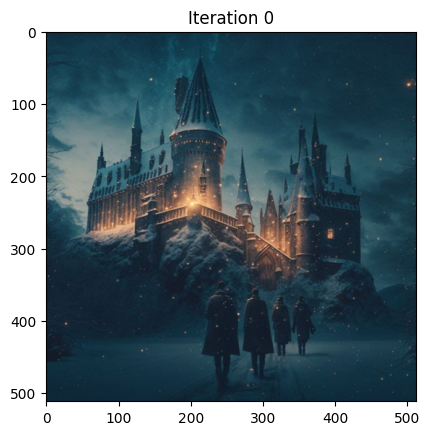

Step 50/300


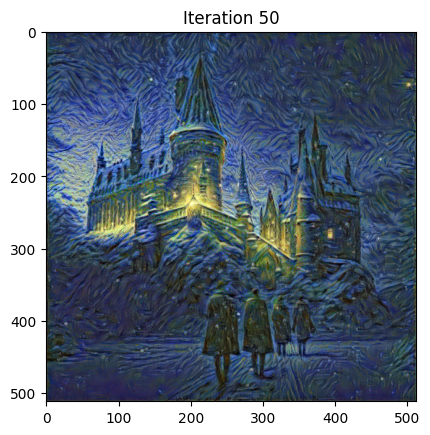

Step 100/300


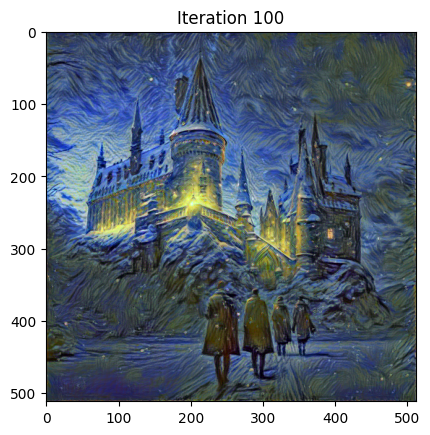

Step 150/300


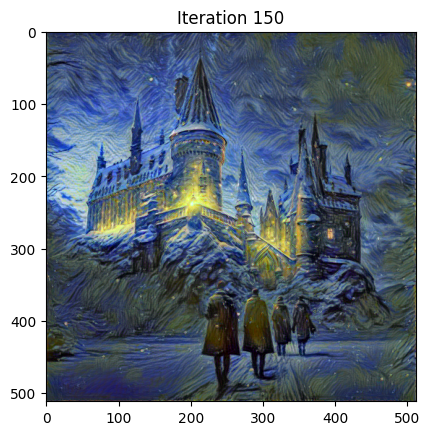

Step 200/300


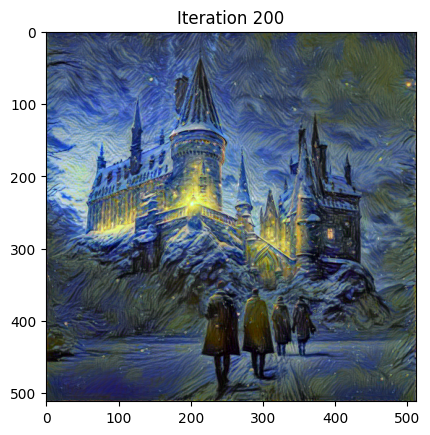

Step 250/300


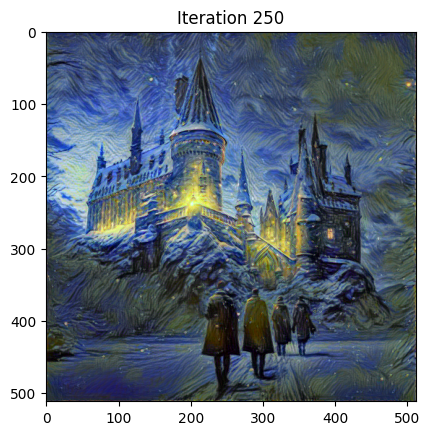

In [46]:
# Train your model using LBFGS optimizer and 2 implemented losses (style loss and content loss)
# You should report the `style loss`, `content loss`, and `total loss` for each iteration. Note that `total loss`
# is the sum of `style loss` and `content loss` with some weights (alpha and beta) which you should tune them.
# Also, please plot the image each 50 iterations.
# An important note is that your optimizer might change the values of the image tensor in a way that the pixel values
# are no longer in the range of [0, 1] (in normalized format). So, you should clip the values of the image tensor
# to be in the range of [0, 1] after each iteration, to prevent any problems occuring to your image.
# TODO


model, style_losses, content_losses  = get_style_model_and_losses(cnn, style_image, content_image)

content_weight = 1
style_weight = 1e6
num_steps = 300
input_image = content_image.clone()
input_image.requires_grad_(True)

model.eval()
model.requires_grad_(False)

optimizer = optimizer = optim.LBFGS([input_image], lr=0.01)

style_losses_list = []
content_losses_list = []
total_losses_list = []

def closure():
    with torch.no_grad():
        input_image.clamp_(0, 1)

    optimizer.zero_grad()
    model(input_image)
    style_score = 0
    content_score = 0

    for sl in style_losses:
        style_score += sl.loss_value
    for cl in content_losses:
        content_score += cl.loss_value

    style_score *= style_weight
    content_score *= content_weight

    loss = style_score + content_score
    loss.backward()

    style_losses_list.append(style_score.item())
    content_losses_list.append(content_score.item())
    total_losses_list.append(loss.item())

    return  style_score + content_score #loss

# Run the optimization
print("Optimizing...")
for step in range(num_steps):
    optimizer.step(closure)
    if step % 50 == 0:
        print(f"Step {step}/{num_steps}")
        imshow(input_image, title=f"Iteration {step}")

with torch.no_grad():
    input_image.clamp_(0, 1)

output_image = input_image
input_image = content_image.clone()

Now, let's see the result of optimization process on our `input_image`.

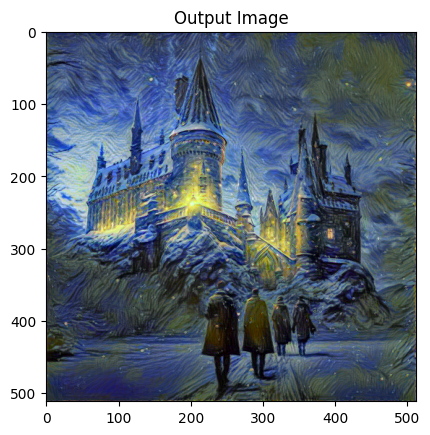

In [47]:
# TODO: Plot the final image


imshow(output_image, title='Output Image')

(5/90 pts) Also, let's plot our `style_losses`, `content_losses` and `total_losses` to see how they change during the optimization process.

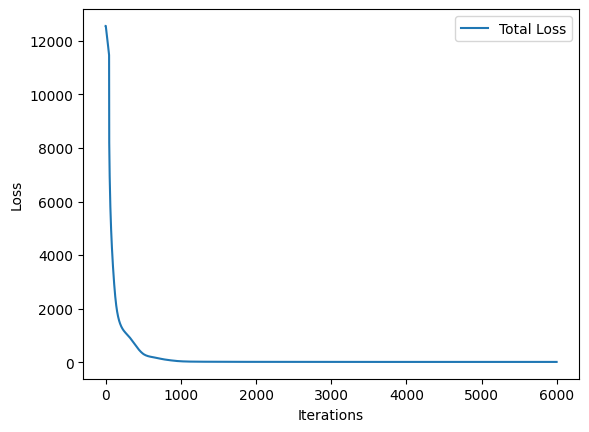

In [48]:
#TODO: Plot the total weighted loss w.r.t. the iteration number
plt.figure()
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.plot(total_losses_list, label='Total Loss')
plt.legend()
plt.show()

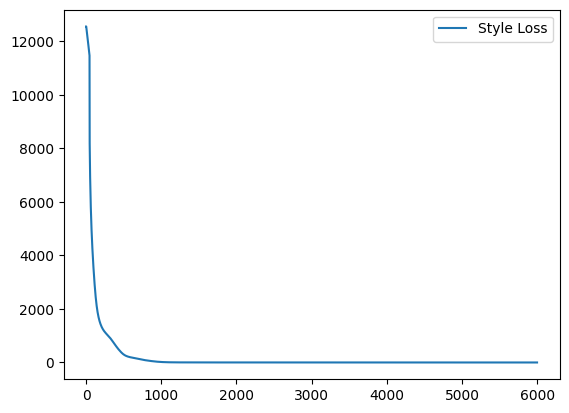

In [49]:
# TODO: Plot the style loss w.r.t. the iteration number
plt.plot(style_losses_list, label='Style Loss')
plt.legend()
plt.show()

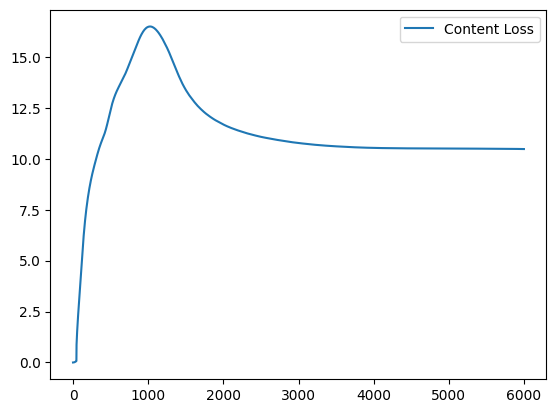

In [50]:
# TODO: Plot the content loss w.r.t. the iteration number
plt.plot(content_losses_list, label='Content Loss')
plt.legend()
plt.show()

In [51]:
plt.ioff()